In [1]:
# basics libraries
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from pandas.plotting import register_matplotlib_converters

# Libraries for maps
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# Units libraries
import metpy.calc as mpcalc
from metpy.units import units

# Time libraries
import matplotlib.dates as mdates

# For metocean statistics
from metocean_stats import plots, tables

# Plots libraries
import matplotlib.colors as mcolors
import seaborn as sns
import matplotlib.colors as colors
from matplotlib.lines import Line2D

Dataset used for latitude, longitude definition

In [2]:
ds_0 = xr.open_dataset("C://Users//kosta//OneDrive//Desktop//Διπλωματική//Results//Maps_diff//hs_mean_diff01.nc", engine="h5netcdf")
ds_0

<xarray.Dataset> Size: 16MB
Dimensions:    (time: 1, bnds: 2, latitude: 787, longitude: 1651)
Coordinates:
    latitude   (latitude, longitude) float32 5MB ...
    longitude  (latitude, longitude) float32 5MB ...
  * time       (time) datetime64[ns] 8B 2020-01-16T11:30:00
Dimensions without coordinates: bnds
Data variables:
    time_bnds  (time, bnds) datetime64[ns] 16B ...
    diff       (time, latitude, longitude) float32 5MB ...
Attributes: (12/22)
    CDI:                              Climate Data Interface version 1.9.6 (h...
    Conventions:                      CF-1.6
    WAVEWATCH_III_version_number:     6.07
    WAVEWATCH_III_switches:           F90 NOGRB NC4 SHRD PR3 UQ FLX0 LN1 ST4 ...
    SIN4 namelist parameter BETAMAX:  1.55
    product_name:                     ww3.run_with_currents202001.nc
    ...                               ...
    start_date:                       2020-01-01 00:00:00
    stop_date:                        2020-01-31 23:00:00
    CDO:                              Climate Data Operators version 1.9.6 (h...
    history:                          Thu Oct  9 13:26:05 2025: ncks -A lan_l...
    history_of_appended_files:        Thu Oct  9 13:26:05 2025: Appended file...
    NCO:                              "4.5.2"

Bathymetry dataset

In [3]:
ds_bathy = xr.open_dataset("c://Users//kosta//OneDrive//Desktop//Διπλωματική//Grid//MED36_bathy_meter.nc", engine="scipy")
ds_bathy

<xarray.Dataset> Size: 16MB
Dimensions:     (Y: 787, X: 1651)
Coordinates:
  * X           (X) int32 7kB 1 2 3 4 5 6 7 ... 1646 1647 1648 1649 1650 1651
  * Y           (Y) int32 3kB 1 2 3 4 5 6 7 8 ... 781 782 783 784 785 786 787
Data variables:
    nav_lon     (Y, X) float32 5MB ...
    nav_lat     (Y, X) float32 5MB ...
    Bathymetry  (Y, X) float32 5MB ...
Attributes:
    Conventions:    CF-1.5
    Grid:           ARAKAWA-C
    Created_by:     SIREN create_bathy
    Creation_date:  2017-01-19 13:00:32
    periodicity:    0.0
    history:        Tue Mar  7 14:42:16 2017: ncrename -d x,X -d y,Y test.nc....

In [4]:
# rename variables inside netcdf dataset
ds_bathy = ds_bathy.rename({"Y": "latitude", "X": "longitude"})
ds_bathy

<xarray.Dataset> Size: 16MB
Dimensions:     (latitude: 787, longitude: 1651)
Coordinates:
  * longitude   (longitude) int32 7kB 1 2 3 4 5 6 ... 1647 1648 1649 1650 1651
  * latitude    (latitude) int32 3kB 1 2 3 4 5 6 7 ... 782 783 784 785 786 787
Data variables:
    nav_lon     (latitude, longitude) float32 5MB ...
    nav_lat     (latitude, longitude) float32 5MB ...
    Bathymetry  (latitude, longitude) float32 5MB ...
Attributes:
    Conventions:    CF-1.5
    Grid:           ARAKAWA-C
    Created_by:     SIREN create_bathy
    Creation_date:  2017-01-19 13:00:32
    periodicity:    0.0
    history:        Tue Mar  7 14:42:16 2017: ncrename -d x,X -d y,Y test.nc....

Define datasets

In [5]:
# No currents 
ds_1 = xr.open_dataset("c://Users//kosta//OneDrive//Desktop//Διπλωματική//Results//Results_Aris//stats//Standard_wave_parameters//stan_mean_no_cur_merged.nc", engine="h5netcdf")
ds_1

<xarray.Dataset> Size: 182MB
Dimensions:    (time: 5, bnds: 2, latitude: 787, longitude: 1651)
Coordinates:
  * time       (time) datetime64[ns] 40B 2020-02-15T11:30:00 ... 2020-11-15T2...
Dimensions without coordinates: bnds, latitude, longitude
Data variables:
    time_bnds  (time, bnds) datetime64[ns] 80B ...
    dir        (time, latitude, longitude) float32 26MB ...
    fp         (time, latitude, longitude) float32 26MB ...
    hs         (time, latitude, longitude) float32 26MB ...
    spr        (time, latitude, longitude) float32 26MB ...
    t01        (time, latitude, longitude) float32 26MB ...
    t02        (time, latitude, longitude) float32 26MB ...
    t0m1       (time, latitude, longitude) float32 26MB ...
Attributes: (12/22)
    CDI:                              Climate Data Interface version 1.9.6 (h...
    history:                          Mon Dec 08 21:35:38 2025: cdo cat stats...
    Conventions:                      CF-1.6
    WAVEWATCH_III_version_number:     6.07
    WAVEWATCH_III_switches:           F90 NOGRB NC4 SHRD PR3 UQ FLX0 LN1 ST4 ...
    SIN4 namelist parameter BETAMAX:  1.55
    ...                               ...
    altitude_resolution:              n/a
    start_date:                       2020-01-01 00:00:00
    stop_date:                        2020-01-31 23:00:00
    history_of_appended_files:        Thu Oct 30 10:37:20 2025: Appended file...
    NCO:                              "4.5.2"
    CDO:                              Climate Data Operators version 1.9.6 (h...

In [6]:
# Differnce between two runs
ds_2 = xr.open_dataset("c://Users//kosta//OneDrive//Desktop//Διπλωματική//Results//Results_Aris//diff//Standard_wave_parameters//stan_mean_diff_merged.nc", engine="h5netcdf")
ds_2

<xarray.Dataset> Size: 182MB
Dimensions:    (time: 5, bnds: 2, latitude: 787, longitude: 1651)
Coordinates:
  * time       (time) datetime64[ns] 40B 2020-02-15T11:30:00 ... 2020-11-15T2...
Dimensions without coordinates: bnds, latitude, longitude
Data variables:
    time_bnds  (time, bnds) datetime64[ns] 80B ...
    dir        (time, latitude, longitude) float32 26MB ...
    fp         (time, latitude, longitude) float32 26MB ...
    hs         (time, latitude, longitude) float32 26MB ...
    spr        (time, latitude, longitude) float32 26MB ...
    t01        (time, latitude, longitude) float32 26MB ...
    t02        (time, latitude, longitude) float32 26MB ...
    t0m1       (time, latitude, longitude) float32 26MB ...
Attributes: (12/20)
    CDI:                              Climate Data Interface version 1.9.6 (h...
    history:                          Mon Dec 08 21:39:40 2025: cdo cat stan_...
    Conventions:                      CF-1.6
    WAVEWATCH_III_version_number:     6.07
    WAVEWATCH_III_switches:           F90 NOGRB NC4 SHRD PR3 UQ FLX0 LN1 ST4 ...
    SIN4 namelist parameter BETAMAX:  1.55
    ...                               ...
    minimum_altitude:                 -12000 m
    maximum_altitude:                 9000 m
    altitude_resolution:              n/a
    start_date:                       2020-01-01 00:00:00
    stop_date:                        2020-01-31 23:00:00
    CDO:                              Climate Data Operators version 1.9.6 (h...

In [7]:
# Forcings
ds_3 = xr.open_dataset("c://Users//kosta//OneDrive//Desktop//Διπλωματική//Results//Results_Aris//forcings//forcings_mean_merged.nc", engine="h5netcdf")
ds_3

<xarray.Dataset> Size: 104MB
Dimensions:    (time: 5, bnds: 2, latitude: 787, longitude: 1651)
Coordinates:
  * time       (time) datetime64[ns] 40B 2020-02-15T11:30:00 ... 2020-11-15T2...
Dimensions without coordinates: bnds, latitude, longitude
Data variables:
    time_bnds  (time, bnds) datetime64[ns] 80B ...
    ucur       (time, latitude, longitude) float32 26MB ...
    vcur       (time, latitude, longitude) float32 26MB ...
    uwnd       (time, latitude, longitude) float32 26MB ...
    vwnd       (time, latitude, longitude) float32 26MB ...
Attributes: (12/20)
    CDI:                              Climate Data Interface version 1.9.6 (h...
    history:                          Mon Dec 08 21:48:29 2025: cdo cat forci...
    Conventions:                      CF-1.6
    WAVEWATCH_III_version_number:     6.07
    WAVEWATCH_III_switches:           F90 NOGRB NC4 SHRD PR3 UQ FLX0 LN1 ST4 ...
    SIN4 namelist parameter BETAMAX:  1.55
    ...                               ...
    minimum_altitude:                 -12000 m
    maximum_altitude:                 9000 m
    altitude_resolution:              n/a
    start_date:                       2020-01-01 00:00:00
    stop_date:                        2020-01-31 23:00:00
    CDO:                              Climate Data Operators version 1.9.6 (h...

In [8]:
# With currents
ds_4 = xr.open_dataset("c://Users//kosta//OneDrive//Desktop//Διπλωματική//Results//Results_Aris//stats//Standard_wave_parameters//stan_mean_with_cur_merged.nc", engine="h5netcdf")
ds_4

<xarray.Dataset> Size: 182MB
Dimensions:    (time: 5, bnds: 2, latitude: 787, longitude: 1651)
Coordinates:
  * time       (time) datetime64[ns] 40B 2020-02-15T11:30:00 ... 2020-11-15T2...
Dimensions without coordinates: bnds, latitude, longitude
Data variables:
    time_bnds  (time, bnds) datetime64[ns] 80B ...
    dir        (time, latitude, longitude) float32 26MB ...
    fp         (time, latitude, longitude) float32 26MB ...
    hs         (time, latitude, longitude) float32 26MB ...
    spr        (time, latitude, longitude) float32 26MB ...
    t01        (time, latitude, longitude) float32 26MB ...
    t02        (time, latitude, longitude) float32 26MB ...
    t0m1       (time, latitude, longitude) float32 26MB ...
Attributes: (12/20)
    CDI:                              Climate Data Interface version 1.9.6 (h...
    history:                          Mon Dec 08 21:36:49 2025: cdo cat stan_...
    Conventions:                      CF-1.6
    WAVEWATCH_III_version_number:     6.07
    WAVEWATCH_III_switches:           F90 NOGRB NC4 SHRD PR3 UQ FLX0 LN1 ST4 ...
    SIN4 namelist parameter BETAMAX:  1.55
    ...                               ...
    minimum_altitude:                 -12000 m
    maximum_altitude:                 9000 m
    altitude_resolution:              n/a
    start_date:                       2020-01-01 00:00:00
    stop_date:                        2020-01-31 23:00:00
    CDO:                              Climate Data Operators version 1.9.6 (h...

Assing coordinates to the data

In [9]:
ds_1 = ds_1.assign_coords(latitude=ds_0.latitude,longitude=ds_0.longitude)
ds_2 = ds_2.assign_coords(latitude=ds_0.latitude, longitude=ds_0.longitude)
ds_3 = ds_3.assign_coords(latitude=ds_0.latitude,longitude=ds_0.longitude)
ds_4 = ds_4.assign_coords(latitude=ds_0.latitude, longitude=ds_0.longitude)
ds_bathy = ds_bathy.assign_coords(latitude=ds_0.latitude,longitude=ds_0.longitude)
ds_bathy

<xarray.Dataset> Size: 26MB
Dimensions:     (latitude: 787, longitude: 1651)
Coordinates:
    latitude    (latitude, longitude) float32 5MB ...
    longitude   (latitude, longitude) float32 5MB ...
Data variables:
    nav_lon     (latitude, longitude) float32 5MB ...
    nav_lat     (latitude, longitude) float32 5MB ...
    Bathymetry  (latitude, longitude) float32 5MB ...
Attributes:
    Conventions:    CF-1.5
    Grid:           ARAKAWA-C
    Created_by:     SIREN create_bathy
    Creation_date:  2017-01-19 13:00:32
    periodicity:    0.0
    history:        Tue Mar  7 14:42:16 2017: ncrename -d x,X -d y,Y test.nc....

Define region of interested

In [10]:
Region_plots = "Mediterrenean sea"
Region_saves = "Mediterrenean sea"
Range_of_regions = {"range" : [-6.5, 37, 30, 46.5]}

In [11]:
List_dataset_index = ["0","1","2","3","4","bathy"]
ds_model_list = [ds_0, ds_1, ds_2, ds_3, ds_4, ds_bathy]

for i in range(len(List_dataset_index)):
    globals()[f"ds_{List_dataset_index[i]}_sel"] = ds_model_list[i].where(
    (ds_0.longitude >= Range_of_regions["range"][0]) & 
    (ds_0.longitude <= Range_of_regions["range"][1]) &
    (ds_0.latitude >= Range_of_regions["range"][2]) & 
    (ds_0.latitude <= Range_of_regions["range"][3]),
    drop=True
)
    

In [12]:
ds_bathy_sel

<xarray.Dataset> Size: 24MB
Dimensions:     (latitude: 787, longitude: 1555)
Coordinates:
    latitude    (latitude, longitude) float32 5MB 30.3 30.3 30.3 ... 44.0 44.0
    longitude   (latitude, longitude) float32 5MB -6.99 -6.962 ... 36.91 36.94
Data variables:
    nav_lon     (latitude, longitude) float32 5MB nan nan nan ... 36.91 36.94
    nav_lat     (latitude, longitude) float32 5MB nan nan nan ... 44.0 44.0 44.0
    Bathymetry  (latitude, longitude) float32 5MB nan nan nan ... nan nan nan
Attributes:
    Conventions:    CF-1.5
    Grid:           ARAKAWA-C
    Created_by:     SIREN create_bathy
    Creation_date:  2017-01-19 13:00:32
    periodicity:    0.0
    history:        Tue Mar  7 14:42:16 2017: ncrename -d x,X -d y,Y test.nc....

Drawing region of interest

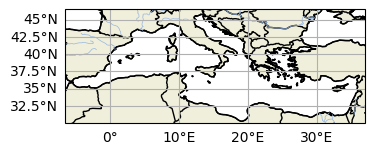

In [13]:
fig = plt.figure(figsize=(10,10)) 
ax = fig.add_axes([0.5, 1, 0.3, 0.2], projection=ccrs.PlateCarree())
ax.coastlines()
ax.add_feature(cfeature.BORDERS, zorder=1, edgecolor='k')
ax.add_feature(cfeature.RIVERS, linewidth=0.5)
    
gl = ax.gridlines(draw_labels=True)
gl.right_labels = False
gl.top_labels = False

# Customize mini map
ax.add_feature(cfeature.LAND, zorder=0, edgecolor='k') # add land mask
# define the extent of the mini map [lon_min,lon_max,lat_min,lat_max]
ax.set_extent([Range_of_regions["range"][0], Range_of_regions["range"][1], 
               Range_of_regions["range"][2], Range_of_regions["range"][3]], 
               crs = ccrs.PlateCarree())               

Setting variables

In [14]:
# Setting variables from dataset

# Standard wave parameters : Hs, t01, t02, t0m1, fp, dir, spr, c_group, stepness, wavelength

# lat-lon
lon = ds_0_sel["longitude"]
lat = ds_0_sel["latitude"]

# diff
diff_hs = ds_2_sel["hs"][:,:,:]
diff_t01 = ds_2_sel["t01"][:,:,:]
diff_spread = ds_2_sel["spr"][:,:,:]
diff_wave_dir = ds_2_sel["dir"][:,:,:]
diff_fp = ds_2_sel["fp"][:,:,:]

# forcings
ucur = ds_3_sel["ucur"][:,:,:]
vcur = ds_3_sel["vcur"][:,:,:]
uwnd = ds_3_sel["uwnd"][:,:,:]
vwnd = ds_3_sel["vwnd"][:,:,:]

# no currents parameters
hs_no_cur = ds_1_sel["hs"][:,:,:]
t01_no_cur = ds_1_sel["t01"][:,:,:]
spread_no_cur = ds_1_sel["spr"][:,:,:]
wave_dir_no_cur = ds_1_sel["dir"][:,:,:]
fp_no_cur = ds_1_sel["fp"][:,:,:]

# with currents parameters
wave_dir_with_cur = ds_4_sel["dir"][:,:,:]
t01_with_cur = ds_4_sel["t01"][:,:,:]
hs_with_cur = ds_4_sel["hs"][:,:,:]

# Bathymetry
Bathymetry = ds_bathy_sel["Bathymetry"][:,:]

Setting values of variables & assing units

In [15]:
# lat-lon
lon2d = lon.values
lat2d = lat.values

# diff
diff_hs2d = diff_hs.values * units("m")
diff_t012d = diff_t01.values * units("s")
diff_spread = diff_spread.values
diff_wave_dir2d = diff_wave_dir.values
diff_fp2d = diff_fp.values * units("1/s")


# forcings
ucur2d = ucur.values * units("m/s") 
vcur2d = vcur.values * units("m/s")
uwnd2d = uwnd.values * units("m/s")
vwnd2d = vwnd.values * units("m/s")

# no currents parameters
hs_no_cur = hs_no_cur.values * units("m")
t01_no_cur = t01_no_cur.values * units("s")
spread_no_cur = spread_no_cur.values
wave_dir_no_cur = wave_dir_no_cur.values
fp_no_cur = fp_no_cur.values * units("1/s")

# with currents parameters
wave_dir_with_cur = wave_dir_with_cur.values
t01_with_cur = t01_with_cur.values * units("s")
hs_with_cur = hs_with_cur.values * units("m")

# Bathymetry
Bathymetry = Bathymetry.values * units("m")

Additional parameters

In [16]:
wnd_speed = np.sqrt(uwnd2d**2 + vwnd2d**2) 
cur_speed = np.sqrt(ucur2d**2 + vcur2d**2)
g = 9.81 * units("m/s**2")
c_phase_with_cur=(g*t01_with_cur)/(2*np.pi)
c_group_with_cur=(g*t01_with_cur)/(4*np.pi)
c_phase_no_cur=(g*t01_no_cur)/(2*np.pi)
c_group_no_cur=(g*t01_no_cur)/(4*np.pi)
wavelength_with_cur=(g*(t01_with_cur**2))/(2*np.pi)
wavelength_no_cur=(g*(t01_no_cur**2))/(2*np.pi)
stepness_with_cur = hs_with_cur/wavelength_with_cur
stepness_no_cur = hs_no_cur/wavelength_no_cur
wave_age_with_cur = c_phase_with_cur/wnd_speed
wave_age_no_cur = c_phase_no_cur/wnd_speed

c:\Users\kosta\AppData\Local\Programs\Python\Python313\Lib\site-packages\pint\facets\plain\quantity.py:1029: RuntimeWarning: divide by zero encountered in divide
  magnitude = magnitude_op(new_self._magnitude, other._magnitude)


In [17]:
diff_stepness2d = stepness_with_cur - stepness_no_cur
diff_wavelength = wavelength_with_cur - wavelength_no_cur
diff_c_group2d = c_group_with_cur - c_group_no_cur

Transforming wind and currents direction with respect to the meteorological convection

In [18]:
wnd_dir = np.degrees(np.arctan2(vwnd, uwnd))
wnd_dir = (270 - wnd_dir) % 360
cur_dir = np.degrees(np.arctan2(vcur, ucur))
cur_dir = (270 - cur_dir) % 360

Computation of wave speed components from wave direction

In [19]:
# WaveWatch direction: degrees, FROM, clockwise from North
D = wave_dir_no_cur  # shape (time, lat, lon)

# FROM -> TO
D_to = (D + 180) % 360

# Meteorological -> mathematical (radians)
theta = np.deg2rad(90 - D_to)

# Unit direction vectors
u_group_no_cur = c_group_no_cur*np.cos(theta)
v_group_no_cur = c_group_no_cur*np.sin(theta)

Computation about relative angles

In [20]:
angle_bet_cur_wave =  cur_dir - wave_dir_no_cur
angle_bet_cur_wnd = cur_dir - wnd_dir
angle_bet_wave_wnd = wave_dir_no_cur - wnd_dir

Angle between currents and wind

In [21]:
rel_angle_cur_wnd = xr.where((wnd_dir < 180) & (angle_bet_cur_wnd <= 180), angle_bet_cur_wnd, xr.where(
    (wnd_dir < 180) & (angle_bet_cur_wnd > 180), angle_bet_cur_wnd - 360, xr.where(
        (wnd_dir > 180) & (angle_bet_cur_wnd >= -180), angle_bet_cur_wnd, xr.where(
            (wnd_dir > 180) & (angle_bet_cur_wnd < -180), 360 + angle_bet_cur_wnd, angle_bet_cur_wnd)
    ) 
))
np.nanmax(rel_angle_cur_wnd), np.nanmin(rel_angle_cur_wnd),np.shape(rel_angle_cur_wnd)

(np.float32(179.99988), np.float32(-179.99957), (5, 787, 1555))

Angle between currents and waves

In [22]:
rel_angle_wave = xr.where((wave_dir_no_cur < 180) & (angle_bet_cur_wave <= 180), angle_bet_cur_wave, xr.where(
    (wave_dir_no_cur < 180) & (angle_bet_cur_wave > 180), angle_bet_cur_wave - 360, xr.where(
        (wave_dir_no_cur > 180) & (angle_bet_cur_wave >= -180), angle_bet_cur_wave, xr.where(
            (wave_dir_no_cur > 180) & (angle_bet_cur_wave < -180), 360 + angle_bet_cur_wave, angle_bet_cur_wave)
    ) 
))
np.nanmax(rel_angle_wave), np.nanmin(rel_angle_wave),np.shape(rel_angle_wave)

(np.float32(179.99992), np.float32(-179.99976), (5, 787, 1555))

Angle between waves and wind

In [23]:
rel_bet_wave_wnd = xr.where((wnd_dir < 180) & (angle_bet_wave_wnd <= 180), angle_bet_wave_wnd, xr.where(
    (wnd_dir < 180) & (angle_bet_wave_wnd > 180), angle_bet_wave_wnd - 360, xr.where(
        (wnd_dir > 180) & (angle_bet_wave_wnd >= -180), angle_bet_wave_wnd, xr.where(
            (wnd_dir > 180) & (angle_bet_wave_wnd < -180), 360 + angle_bet_wave_wnd, angle_bet_wave_wnd)
    ) 
))
np.nanmax(rel_bet_wave_wnd), np.nanmin(rel_bet_wave_wnd),np.shape(rel_bet_wave_wnd)

(np.float32(180.0), np.float32(-179.99976), (5, 787, 1555))

Compute gradients, divergence and vorticity

In [24]:
# Compute grid spacing in meters
dx_g, dy_g = mpcalc.lat_lon_grid_deltas(lon2d, lat2d)
dx_g, dy_g

(<Quantity([[2668.03934275 2667.99574139 2668.13914394 ... 2672.45133563
   2671.72820074 2671.72468849]
  [2667.48486058 2667.48341948 2667.39406119 ... 2671.11516946
   2671.8539974  2671.1166871 ]
  [2666.83116166 2666.74110133 2666.8401848  ... 2670.5012026
   2670.51204283 2670.51459869]
  ...
  [2157.25561779 2157.39300359 2157.34160257 ... 2203.49114008
   2203.47720529 2203.65629462]
  [2156.71600849 2156.8447724  2156.70607919 ... 2202.39092409
   2204.03801465 2203.16288738]
  [2156.08793839 2156.13678022 2156.19358674 ... 2202.503708
   2202.73211631 2202.11186463]], 'meter')>,
 <Quantity([[2655.34945337 2654.28933517 2654.28981004 ... 2500.75928883
   2500.76338107 2500.76338118]
  [2653.01712644 2654.07755706 2654.28932758 ... 2499.70294272
   2499.69885083 2498.63842962]
  [2654.29011449 2653.2293638  2653.0174375  ... 2497.37212878
   2497.58208504 2498.64250472]
  ...
  [2131.36277288 2132.21864987 2132.6534305  ... 1508.88902129
   1508.78553064 1507.52197592]
  [2132.

In [25]:
t,x,y = np.shape(diff_hs2d)[0], np.shape(diff_hs2d)[1], np.shape(diff_hs2d)[2]
t,x,y

(5, 787, 1555)

In [26]:
grad_diff_hs = np.zeros((t,2,x,y))
grad_hs_no_cur = np.zeros((t,2,x,y))
grad_u = np.zeros((t,2,x,y))
grad_v = np.zeros((t,2,x,y))
grad_U = np.zeros((t,2,x,y))
div_hs_no_cur = np.zeros((t,x,y))
div_diff_hs = np.zeros((t,x,y))
div = np.zeros((t,x,y))
vor = np.zeros((t,x,y))
normal_vor = np.zeros((t,x,y))
omega = 7.2921*(10**(-5))
f = 2*omega*np.sin(np.deg2rad(lat2d))

for j in range(0,5):
    gr_diff_hs = mpcalc.gradient(diff_hs2d[j], deltas=(dy_g, dx_g))
    gr_hs_no_cur = mpcalc.gradient(hs_no_cur[j], deltas=(dy_g, dx_g))
    gr_u = mpcalc.gradient(ucur2d[j], deltas=(dy_g, dx_g))
    gr_v = mpcalc.gradient(vcur2d[j], deltas=(dy_g, dx_g))
    gr_U = mpcalc.gradient(cur_speed[j], deltas=(dy_g, dx_g))
    d_hs_no_cur = mpcalc.divergence(hs_no_cur[j],hs_no_cur[j],dx=dx_g,dy=dy_g)
    d_diff_hs = mpcalc.divergence(diff_hs2d[j],diff_hs2d[j],dx=dx_g,dy=dy_g)
    d = mpcalc.divergence(ucur2d[j],vcur2d[j],dx=dx_g,dy=dy_g)
    v = mpcalc.vorticity(ucur2d[j],vcur2d[j],dx=dx_g,dy=dy_g)
    normal_v = (v)/(f)

    grad_diff_hs[j] = gr_diff_hs
    grad_hs_no_cur[j] = gr_hs_no_cur
    grad_u[j] = gr_u
    grad_v[j] = gr_v
    grad_U[j] = gr_U
    div_hs_no_cur[j] = d_hs_no_cur
    div_diff_hs[j] = d_diff_hs
    div[j] = d
    vor[j] = v
    normal_vor[j] = normal_v

np.shape(grad_diff_hs), np.shape(div), np.shape(normal_vor), np.shape(vor)

((5, 2, 787, 1555), (5, 787, 1555), (5, 787, 1555), (5, 787, 1555))

Masking nan values

In [27]:
div_masked = np.ma.masked_invalid(div)
normal_vor_masked = np.ma.masked_invalid(normal_vor)
vor_masked = np.ma.masked_invalid(vor)

Range fuction (for norms and levels in plots)

In [28]:
import numpy as np
from scipy.stats import skew, kurtosis, normaltest

def adaptive_percentile_range(data):
    """
    Compute an adaptive percentile range for plotting, 
    depending on the data distribution.
    
    Returns (lower_bound, upper_bound, coverage_percent).
    """
    data = np.asarray(data)
    data = data[np.isfinite(data)]  # remove NaNs and infs

    # Basic distribution metrics
    s = skew(data)
    k = kurtosis(data)
    stat, pval = normaltest(data)  # normality test (null: normal)

    # Start with default 95% range
    coverage = 95.0
    
    # Adjust for heavy tails or skewed data
    if pval < 0.05:  # not normal
        if abs(s) > 1 or k > 3:       # strongly skewed or heavy tails
            coverage = 90.0
        elif abs(s) > 0.5 or k > 1:   # moderately skewed
            coverage = 93.0
    else:
        coverage = 98.0  # almost normal, show more of the data

    lower = (100 - coverage) / 2
    upper = 100 - lower
    bounds = np.percentile(data, [lower, upper])

    return bounds, coverage


Plots style

In [29]:
def style_axis(ax, title=None, cbar=None, cbar_tick_fontsize=44,
               no_left_labels=False, no_bottom_labels=False):
    """Apply consistent map style and optional title to an axis."""
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS, zorder=1, edgecolor='k')
    ax.add_feature(cfeature.RIVERS, linewidth=0.5)

    # define the extent of the mini map [lon_min,lon_max,lat_min,lat_max]
    ax.set_extent([Range_of_regions["range"][0], Range_of_regions["range"][1], 
                Range_of_regions["range"][2], Range_of_regions["range"][3]], 
                crs = ccrs.PlateCarree()) 
    
    """gl = ax.gridlines(draw_labels=True, alpha = 0)
    gl.right_labels = False
    gl.top_labels = False

    # Set font size for lat/lon labels
    gl.xlabel_style = {'size': 40}
    gl.ylabel_style = {'size': 40}"""

    if no_left_labels:
        gl.left_labels = False

    if no_bottom_labels:
        gl.bottom_labels = False

    if cbar is not None:
        cbar.ax.tick_params(labelsize=cbar_tick_fontsize)  # numbers
    
    if title:
        ax.set_title(title, fontsize=50, weight='bold')
        #ax.set_title(title, fontsize=50)
    return ax

In [30]:
from matplotlib.colors import ListedColormap, BoundaryNorm, LinearSegmentedColormap

# Blue gradient for -90 to 90
blue_cmap = LinearSegmentedColormap.from_list(
    "blue_range", ["#d0e4ff", "#0033cc"]   # light blue → dark blue
)

# For the center region (blue): light → dark
blue_left = blue_cmap(np.linspace(1, 0, 128))
blue_right = blue_cmap(np.linspace(0, 1, 128))

# Red gradient that always goes: light → dark
# (so we can reverse it when needed)
red_base = LinearSegmentedColormap.from_list(
    "red_range_base", ["#ffcccc", "#cc0000"]
)

# For the left red region (-180 → -90): dark → light
red_left = red_base(np.linspace(1, 0, 128))  # reversed

# For the right red region (90 → 180): light → dark
red_right = red_base(np.linspace(0, 1, 128))  # normal direction

# Combine:
combined_colors = np.vstack([red_left, blue_left, blue_right, red_right])
combined_cmap = ListedColormap(combined_colors)

Define regions of interests (fuction)

In [31]:
from matplotlib.patches import Rectangle

def box_text(ax, labels, lon_min, lat_max):
    
    # ---- label inside box ----
    ax.text(
        lon_min + 0.03,           # small x offset
        lat_max - 0.03,            # small y offset
        labels,
        transform=ccrs.PlateCarree(),
        fontsize=62,
        fontweight="bold",
        color="black",
        ha="left",
        va="top",
        zorder=11,
        bbox=dict(
            facecolor="white",
            edgecolor="none",
            alpha=0.5,
            boxstyle="square,pad=0.25"
        )
    )

Complex analysis plot (with additional parameters)

In [ ]:
import os
from matplotlib.colors import TwoSlopeNorm

List_seasons = ["Yearly", "JFM", "AMJ", "JAS", "OND"]
format_bounds = [2,2,2]

for j in range(0,1):
    fig, axes = plt.subplots(4, 2, figsize=(17, 17), subplot_kw=
                            {'projection': ccrs.PlateCarree()})
    ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8 = axes.flatten()

    fig.suptitle(f'{List_seasons[j]} - {Region_plots}', y=0.92, fontsize = 20)

    plt.subplots_adjust(hspace=0.2)  # increase vertical spacing
    step = 11
    bounds_hs_no_cur,_ = adaptive_percentile_range(hs_no_cur[j])
    min_hs_no_cur, max_hs_no_cur = bounds_hs_no_cur
    # Define normalization
    norm_1 = mcolors.Normalize(vmin=min_hs_no_cur, vmax=max_hs_no_cur)
    levels_1 = np.round(np.linspace(min_hs_no_cur, max_hs_no_cur, step), 
                        format_bounds[0])
    levels_1 = np.unique(levels_1)
    cf = ax1.contourf(ds_0_sel.longitude,ds_0_sel.latitude,hs_no_cur[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_1,
                    norm=norm_1, extend = "both",cmap="Spectral_r")
    cbar = fig.colorbar(cf,pad=0.08,ax =ax1,label="SWH_no_cur (m)")
    style_axis(ax1, title="SWH_no_cur")

    bounds_diff_hs,_ = adaptive_percentile_range(diff_hs2d[j])
    min_diff_hs, max_diff_hs = 100*bounds_diff_hs
    # Define normalization
    #norm_2 = TwoSlopeNorm(vmin=min_diff_hs, vcenter=0, vmax=max_diff_hs)
    norm_2 = mcolors.Normalize(vmin=min_diff_hs, vmax=max_diff_hs)
    levels_2 = np.round(np.linspace(min_diff_hs, max_diff_hs, step), 
                        format_bounds[0])
    levels_2 = np.unique(levels_2)
    cf = ax2.contourf(ds_0_sel.longitude,ds_0_sel.latitude,100*diff_hs2d[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_2,
                    norm=norm_2, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.08,ax =ax2,label="diff SWH (Cm)")
    style_axis(ax2, title="Diff SWH")

    bounds_angle_bet_cur_wave,_ = adaptive_percentile_range(rel_angle_wave[j])
    min_angle_bet_cur_wave, max_angle_bet_cur_wave = bounds_angle_bet_cur_wave
    # Define normalization
    norm_3 = mcolors.Normalize(vmin=min_angle_bet_cur_wave, vmax=max_angle_bet_cur_wave)
    levels_3 = np.round(np.linspace(min_angle_bet_cur_wave, max_angle_bet_cur_wave, step), 
                        format_bounds[0])
    levels_3 = np.unique(levels_3)
    cf = ax3.contourf(ds_0_sel.longitude,ds_0_sel.latitude,rel_angle_wave[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_3,
                    norm=norm_3, extend = "both",cmap=combined_cmap)
    cbar = fig.colorbar(cf,pad=0.08,ax =ax3,label="angle_bet_cur_wave (degrees)")
    style_axis(ax3, title="Relative angle between cur and wave")

    bounds_vor,_ = adaptive_percentile_range(normal_vor_masked[j])
    min_vor, max_vor = 100*bounds_vor
    # Define normalization
    norm_4 = mcolors.Normalize(vmin=min_vor, vmax=max_vor)
    levels_4 = np.round(np.linspace(min_vor, max_vor, step), 
                        format_bounds[0])
    levels_4 = np.unique(levels_4)
    cf = ax4.contourf(ds_0_sel.longitude,ds_0_sel.latitude,100*normal_vor_masked[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_4,
                    norm=norm_4, extend = "both",cmap="Spectral_r")
    cbar = fig.colorbar(cf,pad=0.08,ax =ax4,label="Normal vorticity (%)")
    style_axis(ax4, title="Normal vorticity")

    bounds_angle_bet_cur_wnd,_ = adaptive_percentile_range(rel_angle_cur_wnd[j])
    min_angle_bet_cur_wnd, max_angle_bet_cur_wnd = bounds_angle_bet_cur_wnd
    # Define normalization
    norm_5 = mcolors.Normalize(vmin=min_angle_bet_cur_wnd, vmax=max_angle_bet_cur_wnd)
    levels_5 = np.round(np.linspace(min_angle_bet_cur_wnd, max_angle_bet_cur_wnd, step), 
                        format_bounds[0])
    levels_5 = np.unique(levels_5)
    cf = ax5.contourf(ds_0_sel.longitude,ds_0_sel.latitude,rel_angle_cur_wnd[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_5,
                    norm=norm_5, extend = "both",cmap=combined_cmap)
    cbar = fig.colorbar(cf,pad=0.08,ax =ax5,label="angle_bet_wnd_cur (degrees)")
    style_axis(ax5, title="Relative angle between cur and wnd")

    """bounds_bath,_ = adaptive_percentile_range(Bathymetry)
    min_bath, max_bath = bounds_bath
    # Define normalization
    norm_6 = mcolors.Normalize(vmin=min_bath, vmax=max_bath)
    levels_6 = np.round(np.linspace(min_bath, max_bath, step), 
                        format_bounds[0])
    levels_6 = np.unique(levels_6)
    cf = ax6.contourf(ds_0_sel.longitude,ds_0_sel.latitude,Bathymetry, 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_6,
                    norm=norm_6, extend = "both",cmap="Spectral_r")
    cbar = fig.colorbar(cf,pad=0.08,ax =ax6,label="Bathymetry (m)")
    style_axis(ax6, title="Bathymetry")"""

    bounds_step,_ = adaptive_percentile_range(stepness_with_cur[j])
    bounds_wave_age,_ = adaptive_percentile_range(wave_age_with_cur[j])
    min_step, max_step = bounds_step
    min_wave_age, max_wave_age = bounds_wave_age
    # Define normalization
    norm_6 = mcolors.Normalize(vmin=min_step, vmax=max_step)
    levels_6 = np.round(np.linspace(min_step, max_step, step), 
                        3)
    levels_6 = np.unique(levels_6)
    cf = ax6.contourf(ds_0_sel.longitude,ds_0_sel.latitude,stepness_with_cur[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_6,
                    norm=norm_6, extend = "both",cmap="Spectral_r")
    cbar = fig.colorbar(cf,pad=0.08,ax =ax6,label="Wave stepness")
    cs = ax6.contour(ds_0_sel.longitude,ds_0_sel.latitude,wave_age_with_cur[j], 
                     levels = 100,colors='White', 
                     vmin=min_wave_age, vmax=max_wave_age)
    ax6.clabel(cs, fontsize=8)
    style_axis(ax6, title="Wave stepness & wave age")

    """step_norm = 5
    U_norm_group_with_cur = c_group_with_cur[j, ::step_norm, ::step_norm]
    U_group_with_cur = u_group_with_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
    V_group_with_cur = v_group_with_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
    X, Y = lon2d[::step_norm, ::step_norm], lat2d[::step_norm, ::step_norm]

    ax5.quiver(X, Y, U_group_with_cur, V_group_with_cur, transform=ccrs.PlateCarree(), scale_units='xy', scale=None, angles='xy')
"""
    bounds_cur_speed,_ = adaptive_percentile_range(cur_speed[j])
    min_cur_speed, max_cur_speed = bounds_cur_speed
    # Define normalization
    norm_7 = mcolors.Normalize(vmin=min_cur_speed, vmax=max_cur_speed)
    levels_7 = np.round(np.linspace(min_cur_speed, max_cur_speed, step), 
                        format_bounds[0])
    levels_7 = np.unique(levels_7)
    cf = ax7.contourf(ds_0_sel.longitude,ds_0_sel.latitude,cur_speed[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_7,
                    norm=norm_7, extend = "both",cmap="Spectral_r")
    cbar = fig.colorbar(cf,pad=0.08,ax =ax7,label="cur_speed (m/s)")
    style_axis(ax7, title="Currents field")

    step_norm = 3
    U_norm = np.sqrt(ds_3_sel["ucur"][j,::step_norm,::step_norm]**2 + ds_3_sel["vcur"][j,::step_norm,::step_norm]**2)
    U = ds_3_sel["ucur"][j,::step_norm,::step_norm]/U_norm
    V = ds_3_sel["vcur"][j,::step_norm,::step_norm]/U_norm
    X = ds_0_sel.longitude[::step_norm,::step_norm]
    Y = ds_0_sel.latitude[::step_norm,::step_norm]

    ax7.quiver(X,Y,U,V, transform=ccrs.PlateCarree(), scale_units='xy', scale = None, angles = 'xy')

    bounds_wnd_speed,_ = adaptive_percentile_range(wnd_speed[j])
    min_wnd_speed, max_wnd_speed = bounds_wnd_speed
    # Define normalization
    norm_8 = mcolors.Normalize(vmin=min_wnd_speed, vmax=max_wnd_speed)
    levels_8 = np.round(np.linspace(min_wnd_speed, max_wnd_speed, step), 
                        format_bounds[0])
    levels_8 = np.unique(levels_8)
    cf = ax8.contourf(ds_0_sel.longitude,ds_0_sel.latitude,wnd_speed[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_8,
                    norm=norm_8, extend = "both",cmap="Spectral_r")
    cbar = fig.colorbar(cf,pad=0.08,ax =ax8,label="wnd_speed (m/s)")
    style_axis(ax8, title="Wind field")

    step_norm = 7
    U_norm = np.sqrt(ds_3_sel["uwnd"][j,::step_norm,::step_norm]**2 + ds_3_sel["vwnd"][j,::step_norm,::step_norm]**2)
    U = ds_3_sel["uwnd"][j,::step_norm,::step_norm]/U_norm
    V = ds_3_sel["vwnd"][j,::step_norm,::step_norm]/U_norm
    X = ds_0_sel.longitude[::step_norm,::step_norm]
    Y = ds_0_sel.latitude[::step_norm,::step_norm]

    ax8.quiver(X,Y,U,V, transform=ccrs.PlateCarree(), scale_units='xy', scale = None, angles = 'xy')

    # Define the full path for the file, including the non-existent directory
    #output_file = f"C://Users//kosta//OneDrive//Desktop//Διπλωματική//Results//Analysis//Pure analysis//Complex analysis (relative angle & vorticity)//{Region_saves}//complex_plot_{List_seasons[j]} ({Region_plots}).png"

    # Extract the directory path from the file path
    #directory = os.path.dirname(output_file)

    # Create the directory if it does not exist, including any intermediate directories
    #if not os.path.exists(directory):
    #    os.makedirs(directory, exist_ok=True) # exist_ok=True prevents error if dir already exists

    #fig.savefig(output_file)

Complex analysis plot 

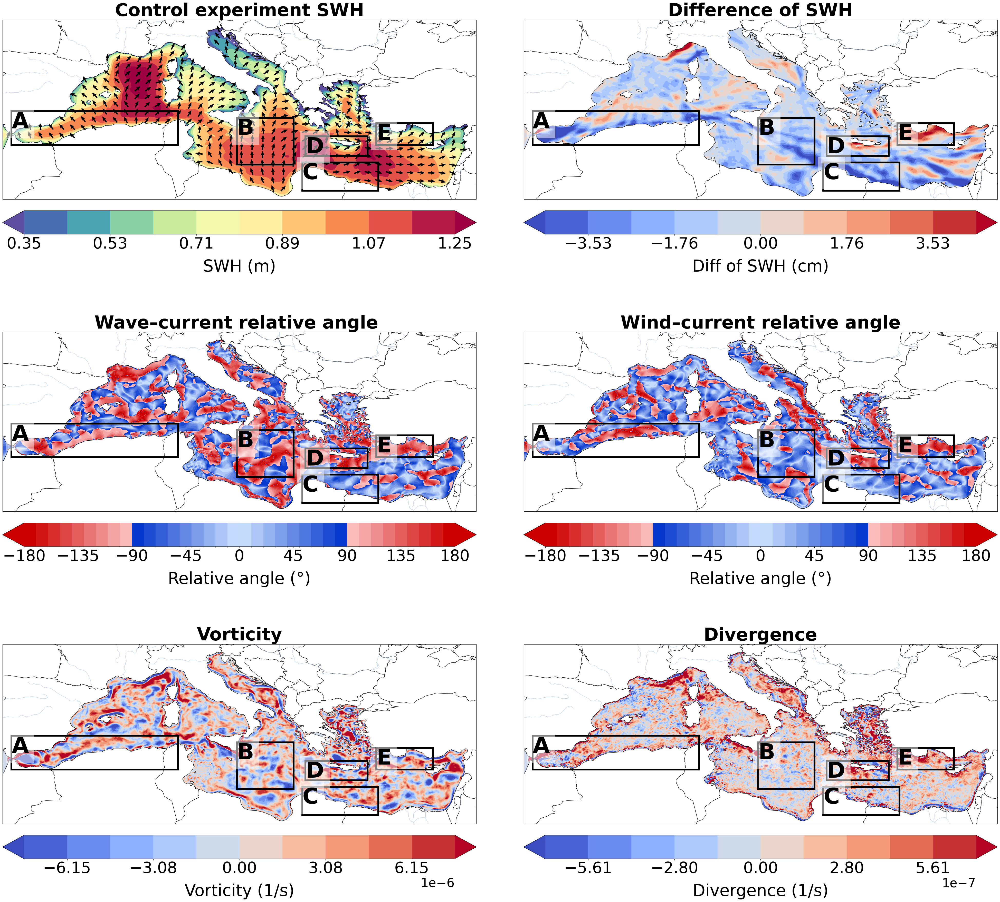

In [80]:
import os
from matplotlib.colors import TwoSlopeNorm

List_seasons = ["Yearly", "JFM", "AMJ", "JAS", "OND"]
format_bounds = [2,2,2]

for j in range(0,1):
    #mosaic = """
    #AABB
    #CCDD
    #EEFF
    #"""

    """fig, ax_dict = plt.subplot_mosaic(
        mosaic,
        figsize=(40, 26),
        subplot_kw={'projection': ccrs.PlateCarree()},
        gridspec_kw={'height_ratios': [1, 1, 1]},
        sharey=True
    )"""

    # Assign axis variables
    """ax1 = ax_dict["A"]
    ax2 = ax_dict["B"]
    ax3 = ax_dict["C"]
    ax4 = ax_dict["D"]
    ax5 = ax_dict["E"]
    ax6 = ax_dict["F"]"""

    #plt.rcParams.update({"axes.titlesize": 18,"axes.labelsize": 22})

    fig, axes = plt.subplots(3, 2, figsize=(50, 46), 
    subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.flatten()  # flatten to a 1D array of length 10
    ax1, ax2, ax3, ax4, ax5, ax6 = axes

    # fig.suptitle(f'Annual mean fields - {Region_plots}', 
    #             x=0.5 ,y=0.92,  ha='center', fontsize = 24) 

    plt.subplots_adjust(hspace=0.1, wspace=0.1)  # increase vertical & horizontal spacing
    CBAR_SHRINK = 1.0
    
    step = 11
    bounds_hs_no_cur,_ = adaptive_percentile_range(hs_no_cur[j])
    min_hs_no_cur, max_hs_no_cur = bounds_hs_no_cur
    # Define normalization
    norm_1 = mcolors.Normalize(vmin=min_hs_no_cur, vmax=max_hs_no_cur)
    levels_1 = np.round(np.linspace(min_hs_no_cur, max_hs_no_cur, step), 
                        format_bounds[0])
    levels_1 = np.unique(levels_1)
    cf = ax1.contourf(ds_0_sel.longitude,ds_0_sel.latitude,hs_no_cur[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_1,
                    norm=norm_1, extend = "both",cmap="Spectral_r")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax1,label="SWH (m)",
                        shrink=CBAR_SHRINK, orientation='horizontal')
    cbar.set_label(label="SWH (m)", size=46, labelpad=20)

    step_norm = 35
    U_norm_group_with_cur = c_group_no_cur[j, ::step_norm, ::step_norm]
    U_group_with_cur = u_group_no_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
    V_group_with_cur = v_group_no_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
    X, Y = lon2d[::step_norm, ::step_norm], lat2d[::step_norm, ::step_norm]

    ax1.quiver(X, Y, U_group_with_cur, V_group_with_cur, transform=ccrs.PlateCarree(),pivot = 'mid',  
                scale_units='xy', scale=1.5, angles='xy', width = 0.0027,
                headlength = 3.5, headaxislength = 3.0)
    style_axis(ax1, title="Control experiment SWH", cbar=cbar, 
               cbar_tick_fontsize=44)

    bounds_diff_hs,_ = adaptive_percentile_range(diff_hs2d[j])
    min_diff_hs, max_diff_hs = 100*bounds_diff_hs
    # symmetric range
    abs_max = max(abs(min_diff_hs), abs(max_diff_hs))

    # choose normalization automatically
    if min_diff_hs < 0 and max_diff_hs > 0:
        # mixed values → use diverging normalization centered at 0
        norm_2 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)
    else:
        # only positive or only negative → use standard normalization
        norm_2 = mcolors.Normalize(vmin=min_diff_hs, vmax=max_diff_hs)
    levels_2 = np.round(np.linspace(-abs_max, abs_max, step), 
                        format_bounds[0])
    levels_2 = np.unique(levels_2)
    cf = ax2.contourf(ds_0_sel.longitude,ds_0_sel.latitude,100*diff_hs2d[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_2,
                    norm=norm_2, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax2,label="Diff of SWH (cm)",
                        shrink=CBAR_SHRINK, orientation='horizontal')
    cbar.set_label(label="Diff of SWH (cm)", size=46, labelpad=20)
    style_axis(ax2, title="Difference of SWH", cbar=cbar, cbar_tick_fontsize=44)

    angle_bounds = np.linspace(-180, 180, 37)
    angle_norm = BoundaryNorm(angle_bounds, combined_cmap.N)
    ticks = [-180, -135, -90, -45, 0, 45, 90, 135, 180]

    cf = ax3.contourf(ds_0_sel.longitude,ds_0_sel.latitude,rel_angle_wave[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=angle_bounds,
                    norm=angle_norm, extend = "both",cmap=combined_cmap)
    cbar = fig.colorbar(cf,pad=0.04,ax =ax3,label="Relative angle (°)",
                        shrink=CBAR_SHRINK, ticks=ticks, orientation='horizontal')
    cbar.set_label(label="Relative angle (°)", size=46, labelpad=20)
    style_axis(ax3, title="Wave–current relative angle ", cbar=cbar, 
               cbar_tick_fontsize=44)
    
    angle_bounds = np.linspace(-180, 180, 37)
    angle_norm = BoundaryNorm(angle_bounds, combined_cmap.N)
    ticks = [-180, -135, -90, -45, 0, 45, 90, 135, 180]

    cf = ax4.contourf(ds_0_sel.longitude,ds_0_sel.latitude,rel_angle_cur_wnd[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=angle_bounds,
                    norm=angle_norm, extend = "both",cmap=combined_cmap)
    cbar = fig.colorbar(cf,pad=0.04,ax =ax4,label="Relative angle (°)",
                        shrink=CBAR_SHRINK, ticks=ticks, orientation='horizontal')
    cbar.set_label(label="Relative angle (°)", size=46, labelpad=20)
    style_axis(ax4, title="Wind–current relative angle", cbar=cbar, 
               cbar_tick_fontsize=44)

    bounds_vor,_ = adaptive_percentile_range(vor_masked[j])
    min_vor, max_vor = bounds_vor
    # symmetric range
    abs_max = max(abs(min_vor), abs(max_vor))

     # choose normalization automatically
    if min_vor < 0 and max_vor > 0:
        # mixed values → use diverging normalization centered at 0
        norm_5 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)
    else:
        # only positive or only negative → use standard normalization
        norm_5 = mcolors.Normalize(vmin=min_vor, vmax=max_vor)
    levels_5 = np.round(np.linspace(-abs_max, abs_max, step), 
                        8)
    levels_5 = np.unique(levels_5)
    cf = ax5.contourf(ds_0_sel.longitude,ds_0_sel.latitude,vor_masked[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_5,
                    norm=norm_5, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax5,label="Vorticity (1/s)",
                        shrink=CBAR_SHRINK, orientation='horizontal')
    cbar.set_label(label="Vorticity (1/s)", size=46, labelpad=20)
    cbar.ax.xaxis.get_offset_text().set_fontsize(35)
    style_axis(ax5, title="Vorticity", cbar=cbar, cbar_tick_fontsize=44)

    bounds_step,_ = adaptive_percentile_range(div_masked[j])
    min_step, max_step = bounds_step
    # symmetric range
    abs_max = max(abs(min_step), abs(max_step))
     # choose normalization automatically
    if min_step < 0 and max_step > 0:
        # mixed values → use diverging normalization centered at 0
        norm_6 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)
    else:
        # only positive or only negative → use standard normalization
        norm_6 = mcolors.Normalize(vmin=min_step, vmax=max_step)
    levels_6 = np.round(np.linspace(-abs_max, abs_max, step), 
                        9)
    levels_6 = np.unique(levels_6)
    cf = ax6.contourf(ds_0_sel.longitude,ds_0_sel.latitude,div_masked[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_6,
                    norm=norm_6, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax6,label="Divergence (1/s)",
                        shrink=CBAR_SHRINK, orientation='horizontal')
    cbar.set_label(label="Divergence (1/s)", size=46, labelpad=20)
    cbar.ax.xaxis.get_offset_text().set_fontsize(35) 
    style_axis(ax6, title="Divergence", cbar=cbar, cbar_tick_fontsize=44)

    labels = ["A", "B", "C", "D", "E"]

    if j == 0: 

        lon_min = [-5.7, 15, 21, 21.3, 27.8]
        lon_max = [9.6, 20.2, 28, 27, 33]
        lat_min = [35, 33.2, 30.8, 34, 35]
        lat_max = [38.1, 37.5, 33.4, 35.8, 37]

for ax in (ax1, ax2, ax3, ax4, ax5, ax6):
    roi_box_1 = Rectangle(
        (lon_min[0], lat_min[0]), lon_max[0] - lon_min[0], lat_max[0] - lat_min[0],
        linewidth=5, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
    roi_box_2 = Rectangle(
        (lon_min[1], lat_min[1]), lon_max[1] - lon_min[1], lat_max[1] - lat_min[1],
        linewidth=5, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
    roi_box_3 = Rectangle(
        (lon_min[2], lat_min[2]), lon_max[2] - lon_min[2], lat_max[2] - lat_min[2],
        linewidth=5, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
    roi_box_4 = Rectangle(
        (lon_min[3], lat_min[3]), lon_max[3] - lon_min[3], lat_max[3] - lat_min[3],
        linewidth=5, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
    roi_box_5 = Rectangle(
        (lon_min[4], lat_min[4]), lon_max[4] - lon_min[4], lat_max[4] - lat_min[4],
        linewidth=5, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
    
    ax.add_patch(roi_box_1)
    box_text(ax,labels=labels[0],lon_min=lon_min[0],lat_max=lat_max[0])
    ax.add_patch(roi_box_2)
    box_text(ax,labels=labels[1],lon_min=lon_min[1],lat_max=lat_max[1])
    ax.add_patch(roi_box_3)
    box_text(ax,labels=labels[2],lon_min=lon_min[2],lat_max=lat_max[2])
    ax.add_patch(roi_box_4)
    box_text(ax,labels=labels[3],lon_min=lon_min[3],lat_max=lat_max[3])
    ax.add_patch(roi_box_5)
    box_text(ax,labels=labels[4],lon_min=lon_min[4],lat_max=lat_max[4])

    """# Define the full path for the file, including the non-existent directory
    output_file = f"C://Users//kosta//OneDrive//Desktop//Διπλωματική//Results//Analysis//Pure analysis//Complex analysis (relative angle & vorticity)//SWH//{Region_saves}//complex_plot_{List_seasons[j]} ({Region_plots}).png"

    # Extract the directory path from the file path
    directory = os.path.dirname(output_file)

    # Create the directory if it does not exist, including any intermediate directories
    if not os.path.exists(directory):
        os.makedirs(directory, exist_ok=True) # exist_ok=True prevents error if dir already exists

    fig.savefig(output_file)"""

Differences between reference and current-forced experiments

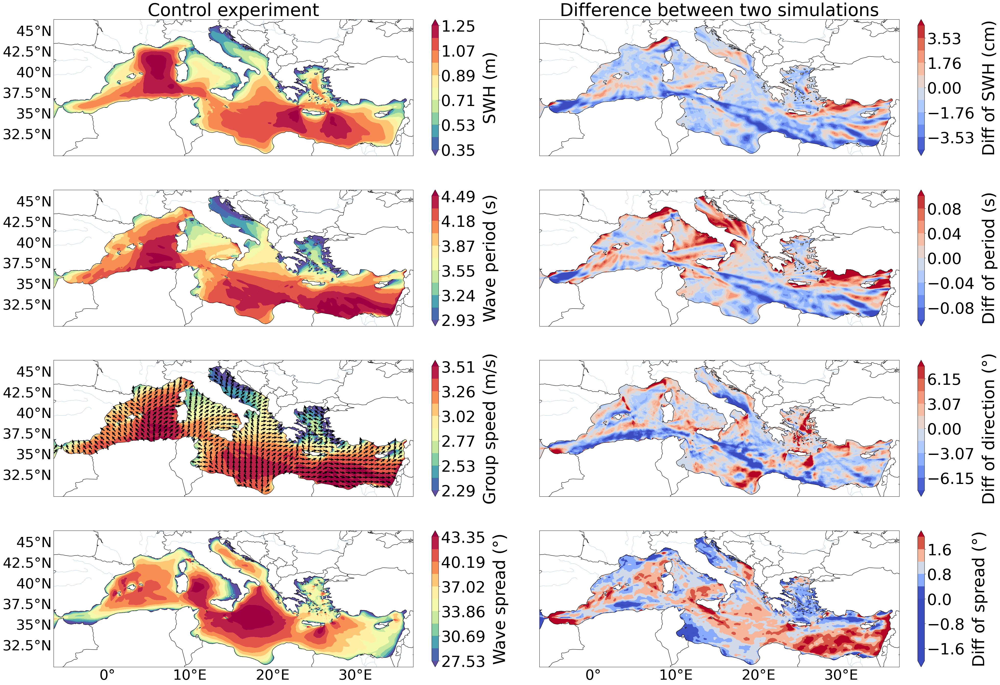

In [ ]:
import os
from matplotlib.colors import TwoSlopeNorm

List_seasons = ["Yearly", "JFM", "AMJ", "JAS", "OND"]
format_bounds = [2,2,2]

for j in range(0,1):
    
    fig, axes = plt.subplots(4, 2, figsize=(48, 33), 
    subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.flatten()  # flatten to a 1D array of length 10

    ax1, ax2, ax3, ax4, ax5, ax6, ax7, ax8 = axes

    # fig.suptitle(f'Annual mean - {Region_plots}', 
    #             x=0.5 ,y=0.92,  ha='center', fontsize = 24) 

    plt.subplots_adjust(hspace=0.25, wspace=0.05)  # increase vertical spacing
    CBAR_SHRINK = 1.0
    
    step = 11
    bounds_hs_no_cur,_ = adaptive_percentile_range(hs_no_cur[j])
    min_hs_no_cur, max_hs_no_cur = bounds_hs_no_cur
    # Define normalization
    norm_1 = mcolors.Normalize(vmin=min_hs_no_cur, vmax=max_hs_no_cur)
    levels_1 = np.round(np.linspace(min_hs_no_cur, max_hs_no_cur, step), 
                        format_bounds[0])
    levels_1 = np.unique(levels_1)
    cf = ax1.contourf(ds_0_sel.longitude,ds_0_sel.latitude,hs_no_cur[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_1,
                    norm=norm_1, extend = "both",cmap="Spectral_r")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax1,label="SWH (m)",
                        shrink=CBAR_SHRINK)
    cbar.set_label(label="SWH (m)", size=46, labelpad=20)
    style_axis(ax1, title="Control experiment", cbar=cbar, 
               cbar_tick_fontsize=44, no_bottom_labels=True)

    bounds_diff_hs,_ = adaptive_percentile_range(diff_hs2d[j])
    min_diff_hs, max_diff_hs = 100*bounds_diff_hs
    # symmetric range
    abs_max = max(abs(min_diff_hs), abs(max_diff_hs))

    # choose normalization automatically
    if min_diff_hs < 0 and max_diff_hs > 0:
        # mixed values → use diverging normalization centered at 0
        norm_2 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)
    else:
        # only positive or only negative → use standard normalization
        norm_2 = mcolors.Normalize(vmin=min_diff_hs, vmax=max_diff_hs)
    levels_2 = np.round(np.linspace(-abs_max, abs_max, step), 
                        format_bounds[0])
    levels_2 = np.unique(levels_2)
    cf = ax2.contourf(ds_0_sel.longitude,ds_0_sel.latitude,100*diff_hs2d[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_2,
                    norm=norm_2, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax2,label="Diff of SWH (cm)",
                        shrink=CBAR_SHRINK)
    cbar.set_label(label="Diff of SWH (cm)", size=46, labelpad=20)
    style_axis(ax2, title="Difference between two simulations", cbar=cbar, 
               cbar_tick_fontsize=44, no_bottom_labels=True,
               no_left_labels=True)

    bounds_hs_no_cur,_ = adaptive_percentile_range(t01_no_cur[j])
    min_hs_no_cur, max_hs_no_cur = bounds_hs_no_cur
    # Define normalization
    norm_3 = mcolors.Normalize(vmin=min_hs_no_cur, vmax=max_hs_no_cur)
    levels_3 = np.round(np.linspace(min_hs_no_cur, max_hs_no_cur, step), 
                        format_bounds[0])
    levels_3 = np.unique(levels_3)
    cf = ax3.contourf(ds_0_sel.longitude,ds_0_sel.latitude,t01_no_cur[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_3,
                    norm=norm_3, extend = "both",cmap="Spectral_r")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax3,label="SWH (m)",
                        shrink=CBAR_SHRINK)
    cbar.set_label(label="Wave period (s)", size=46, labelpad=20)
    style_axis(ax3, cbar=cbar, no_bottom_labels=True,
               cbar_tick_fontsize=44)
    
    bounds_diff_hs,_ = adaptive_percentile_range(diff_t012d[j])
    min_diff_hs, max_diff_hs = bounds_diff_hs
    # symmetric range
    abs_max = max(abs(min_diff_hs), abs(max_diff_hs))

    # choose normalization automatically
    if min_diff_hs < 0 and max_diff_hs > 0:
        # mixed values → use diverging normalization centered at 0
        norm_4 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)
    else:
        # only positive or only negative → use standard normalization
        norm_4 = mcolors.Normalize(vmin=min_diff_hs, vmax=max_diff_hs)
    levels_4 = np.round(np.linspace(-abs_max, abs_max, step), 
                        format_bounds[0])
    levels_4 = np.unique(levels_4)
    cf = ax4.contourf(ds_0_sel.longitude,ds_0_sel.latitude,diff_t012d[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_4,
                    norm=norm_4, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax4,label="Diff of SWH (cm)",
                        shrink=CBAR_SHRINK)
    cbar.set_label(label="Diff of period (s)", size=46, labelpad=20)
    style_axis(ax4, cbar=cbar, cbar_tick_fontsize=44, no_bottom_labels=True,
               no_left_labels=True)

    bounds_hs_no_cur,_ = adaptive_percentile_range(c_group_no_cur[j])
    min_hs_no_cur, max_hs_no_cur = bounds_hs_no_cur
    # Define normalization
    norm_5 = mcolors.Normalize(vmin=min_hs_no_cur, vmax=max_hs_no_cur)
    levels_5 = np.round(np.linspace(min_hs_no_cur, max_hs_no_cur, step), 
                        format_bounds[0])
    levels_5 = np.unique(levels_5)
    cf = ax5.contourf(ds_0_sel.longitude,ds_0_sel.latitude,c_group_no_cur[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_5,
                    norm=norm_5, extend = "both",cmap="Spectral_r")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax5,label="SWH (m)",
                        shrink=CBAR_SHRINK)
    cbar.set_label(label="Group speed (m/s)", size=46, labelpad=20)
    style_axis(ax5, cbar=cbar, no_bottom_labels=True,
               cbar_tick_fontsize=44)

    step_norm = 25
    U_norm_group_with_cur = c_group_no_cur[j, ::step_norm, ::step_norm]
    U_group_with_cur = u_group_no_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
    V_group_with_cur = v_group_no_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
    X, Y = lon2d[::step_norm, ::step_norm], lat2d[::step_norm, ::step_norm]

    ax5.quiver(X, Y, U_group_with_cur, V_group_with_cur, transform=ccrs.PlateCarree(),pivot = 'mid',  
                scale_units='xy', scale=1.5, angles='xy', width = 0.0027,
                headlength = 3.5, headaxislength = 3.0)
    
    bounds_diff_wave_dir,_ = adaptive_percentile_range(diff_wave_dir2d[j])
    min_diff_wave_dir, max_diff_wave_dir = bounds_diff_wave_dir
    # symmetric range
    abs_max = max(abs(min_diff_wave_dir), abs(max_diff_wave_dir))

    # choose normalization automatically
    if min_diff_wave_dir < 0 and max_diff_wave_dir > 0:
        # mixed values → use diverging normalization centered at 0
        norm_6 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, 
                              vmax=abs_max)
    else:
        # only positive or only negative → use standard normalization
        norm_6 = mcolors.Normalize(vmin=min_diff_wave_dir, 
                                   vmax=max_diff_wave_dir)
    levels_6 = np.round(np.linspace(-abs_max, abs_max, step), 
                        format_bounds[0])
    levels_6 = np.unique(levels_6)
    cf = ax6.contourf(ds_0_sel.longitude,ds_0_sel.latitude,diff_wave_dir2d[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_6,
                    norm=norm_6, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax6,label="Diff of wave dir (°)",
                        shrink=CBAR_SHRINK)
    cbar.set_label(label="Diff of direction (°)", size=46, labelpad=20)
    style_axis(ax6, cbar=cbar, cbar_tick_fontsize=44, no_bottom_labels=True,
               no_left_labels=True)

    bounds_hs_no_cur,_ = adaptive_percentile_range(spread_no_cur[j])
    min_hs_no_cur, max_hs_no_cur = bounds_hs_no_cur
    # Define normalization
    norm_7 = mcolors.Normalize(vmin=min_hs_no_cur, vmax=max_hs_no_cur)
    levels_7 = np.round(np.linspace(min_hs_no_cur, max_hs_no_cur, step), 
                        format_bounds[0])
    levels_7 = np.unique(levels_7)
    cf = ax7.contourf(ds_0_sel.longitude,ds_0_sel.latitude,spread_no_cur[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_7,
                    norm=norm_7, extend = "both",cmap="Spectral_r")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax7,label="SWH (m)",
                        shrink=CBAR_SHRINK)
    cbar.set_label(label="Wave spread (°)", size=46, labelpad=20)
    style_axis(ax7, cbar=cbar, 
               cbar_tick_fontsize=44)
    
    bounds_diff_hs,_ = adaptive_percentile_range(diff_spread[j])
    min_diff_hs, max_diff_hs = bounds_diff_hs
    # symmetric range
    abs_max = max(abs(min_diff_hs), abs(max_diff_hs))

    # choose normalization automatically
    if min_diff_hs < 0 and max_diff_hs > 0:
        # mixed values → use diverging normalization centered at 0
        norm_8 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)
    else:
        # only positive or only negative → use standard normalization
        norm_8 = mcolors.Normalize(vmin=min_diff_hs, vmax=max_diff_hs)
    levels_8 = np.round(np.linspace(-abs_max, abs_max, step), 
                        format_bounds[0])
    levels_8 = np.unique(levels_8)
    cf = ax8.contourf(ds_0_sel.longitude,ds_0_sel.latitude,diff_spread[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_8,
                    norm=norm_8, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.04,ax =ax8,label="Diff of SWH (cm)",
                        shrink=CBAR_SHRINK)
    cbar.set_label(label="Diff of spread (°)", size=46, labelpad=20)
    style_axis(ax8, cbar=cbar, cbar_tick_fontsize=44, no_left_labels=True)

Seasonal variability plots

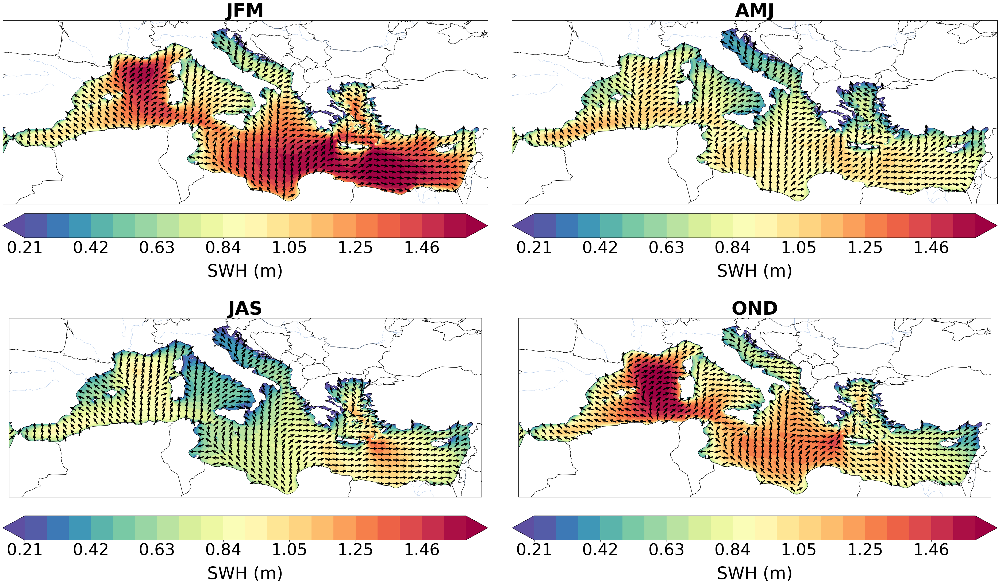

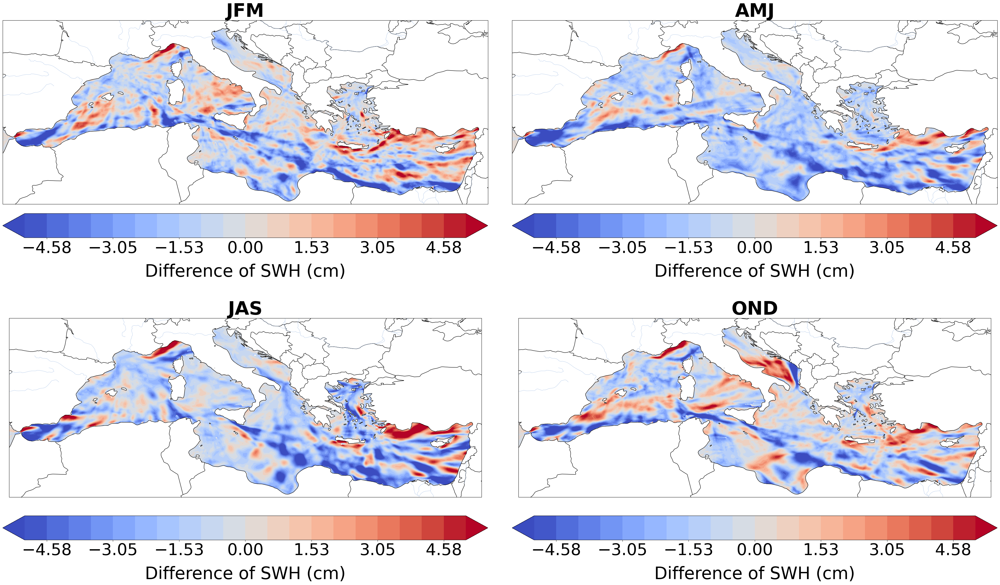

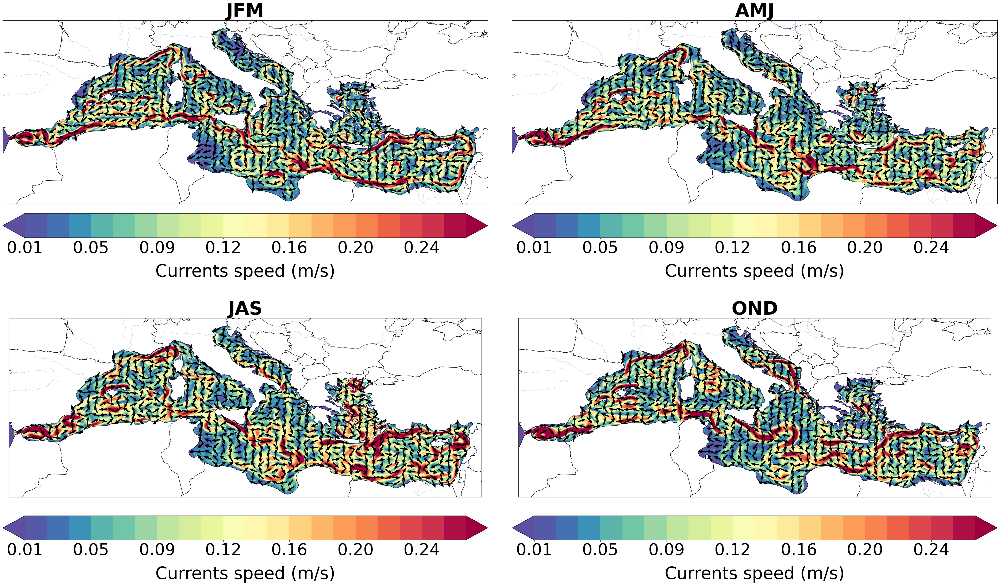

In [48]:
import os
from matplotlib.colors import TwoSlopeNorm

List_parameters = [hs_no_cur, 100*diff_hs2d, cur_speed]
List_seasons = ["Yearly", "JFM", "AMJ", "JAS", "OND"]
format_bounds = [2,2,2]
max_values_parameters = np.zeros((3,4))
min_values_parameters = np.zeros((3,4))
List_bounds = np.zeros((3,2))

for i in range(0,3):
    for j in range(0,4):
        bounds_hs_no_cur,_ = adaptive_percentile_range(List_parameters[i][j+1])
        min_values_parameters[i][j],max_values_parameters[i][j] = bounds_hs_no_cur

List_bounds = np.array([[np.nanmax(max_values_parameters[0]), np.nanmin(min_values_parameters[0])], 
               [np.nanmax(max_values_parameters[1]), np.nanmin(min_values_parameters[1])],
               [np.nanmax(max_values_parameters[2]), np.nanmin(min_values_parameters[2])]])

for i in range(0,3):
    fig, axes = plt.subplots(2, 2, figsize=(48, 26), 
    subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.flatten()  # flatten to a 1D array of length 10
    ax1, ax2, ax3, ax4 = axes
    plt.subplots_adjust(hspace=0.3, wspace=0.05)  # increase vertical spacing
    CBAR_SHRINK = 1.0
    for j in range(0,4):

        # fig.suptitle(f'Annual mean - {Region_plots}', 
        #             x=0.5 ,y=0.92,  ha='center', fontsize = 24) 
        
        step = 21
        max_hs_no_cur, min_hs_no_cur = List_bounds[i]
        
        if i == 0:
            # Define normalization
            norm_1 = mcolors.Normalize(vmin=min_hs_no_cur, vmax=max_hs_no_cur)
            levels_1 = np.round(np.linspace(min_hs_no_cur, max_hs_no_cur, step), 
                                format_bounds[0])
            levels_1 = np.unique(levels_1)
            cf = axes[j].contourf(ds_0_sel.longitude,ds_0_sel.latitude,List_parameters[i][j+1], 
                            transform=ccrs.PlateCarree(), 
                            levels=levels_1,
                            norm=norm_1, extend = "both",cmap="Spectral_r")
            if j == 0:
                cbar = fig.colorbar(cf,pad=0.04,ax =axes[j],label="SWH (m)",
                                shrink=CBAR_SHRINK, orientation='horizontal')
                style_axis(axes[j], title="JFM", cbar=cbar, 
                        cbar_tick_fontsize=44, no_bottom_labels=True)
            elif j == 1:
                cbar = fig.colorbar(cf,pad=0.04,ax =axes[j],label="SWH (m)",
                                shrink=CBAR_SHRINK, orientation='horizontal')
                style_axis(axes[j], title="AMJ", cbar=cbar, 
                        cbar_tick_fontsize=44, no_bottom_labels=True,
                        no_left_labels=True)
            elif j == 3:
                cbar = fig.colorbar(cf,pad=0.08,ax =axes[j],label="SWH (m)",
                                shrink=CBAR_SHRINK, orientation='horizontal')
                style_axis(axes[j], title="OND", cbar=cbar, 
                        cbar_tick_fontsize=44,
                        no_left_labels=True)
            else: 
                cbar = fig.colorbar(cf,pad=0.08,ax =axes[j],label="SWH (m)",
                                shrink=CBAR_SHRINK, orientation='horizontal')
                style_axis(axes[j], title="JAS", cbar=cbar, 
                        cbar_tick_fontsize=44)
            cbar.set_label(label="SWH (m)", size=46, labelpad=20)

            step_norm = 25
            U_norm_group_with_cur = c_group_no_cur[j, ::step_norm, ::step_norm]
            U_group_with_cur = u_group_no_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
            V_group_with_cur = v_group_no_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
            X, Y = lon2d[::step_norm, ::step_norm], lat2d[::step_norm, ::step_norm]

            axes[j].quiver(X, Y, U_group_with_cur, V_group_with_cur, transform=ccrs.PlateCarree(),pivot = 'mid',  
                        scale_units='xy', scale=1.5, angles='xy', width = 0.0025,
                        headlength = 3.5, headaxislength = 3.0)
            
                
        elif i == 1:    
            abs_max = max(abs(min_hs_no_cur), abs(max_hs_no_cur))

            # choose normalization automatically
            if min_hs_no_cur < 0 and max_hs_no_cur > 0:
                # mixed values → use diverging normalization centered at 0
                norm_2 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)
            else:
                # only positive or only negative → use standard normalization
                norm_2 = mcolors.Normalize(vmin=min_hs_no_cur, vmax=max_hs_no_cur)
            levels_2 = np.round(np.linspace(-abs_max, abs_max, step), 
                                format_bounds[0])
            levels_2 = np.unique(levels_2)
            cf = axes[j].contourf(ds_0_sel.longitude,ds_0_sel.latitude,List_parameters[i][j+1], 
                            transform=ccrs.PlateCarree(), 
                            levels=levels_2,
                            norm=norm_2, extend = "both",cmap="coolwarm")
            if j == 0:
                cbar = fig.colorbar(cf,pad=0.04,ax =axes[j],
                                shrink=CBAR_SHRINK, orientation='horizontal')
                cbar.set_label(label="Difference of SWH (cm)", size=46, labelpad=20)
                style_axis(axes[j], title="JFM", cbar=cbar, 
                        cbar_tick_fontsize=44, no_bottom_labels=True)
    
            elif j == 1:
                cbar = fig.colorbar(cf,pad=0.04,ax =axes[j],
                                shrink=CBAR_SHRINK, orientation='horizontal')
                cbar.set_label(label="Difference of SWH (cm)", size=46, labelpad=20)
                style_axis(axes[j], title="AMJ", cbar=cbar, 
                        cbar_tick_fontsize=44, no_bottom_labels=True,
                        no_left_labels=True)
            elif j == 3:
                cbar = fig.colorbar(cf,pad=0.08,ax =axes[j],
                                shrink=CBAR_SHRINK, orientation='horizontal')
                cbar.set_label(label="Difference of SWH (cm)", size=46, labelpad=20)
                style_axis(axes[j], title="OND", cbar=cbar, 
                        cbar_tick_fontsize=44,
                        no_left_labels=True)
            else: 
                cbar = fig.colorbar(cf,pad=0.08,ax =axes[j],
                                shrink=CBAR_SHRINK, orientation='horizontal')
                cbar.set_label(label="Difference of SWH (cm)", size=46, labelpad=20)
                style_axis(axes[j], title="JAS", cbar=cbar, 
                        cbar_tick_fontsize=44)
        else:
            # Define normalization
            norm_1 = mcolors.Normalize(vmin=min_hs_no_cur, vmax=max_hs_no_cur)
            levels_1 = np.round(np.linspace(min_hs_no_cur, max_hs_no_cur, step), 
                                format_bounds[0])
            levels_1 = np.unique(levels_1)
            cf = axes[j].contourf(ds_0_sel.longitude,ds_0_sel.latitude,List_parameters[i][j+1], 
                            transform=ccrs.PlateCarree(), 
                            levels=levels_1,
                            norm=norm_1, extend = "both",cmap="Spectral_r")
            if j == 0:
                cbar = fig.colorbar(cf,pad=0.04,ax =axes[j],label="SWH (m)",
                                shrink=CBAR_SHRINK, orientation='horizontal')
                style_axis(axes[j], title="JFM", cbar=cbar, 
                        cbar_tick_fontsize=44, no_bottom_labels=True)
            elif j == 1:
                cbar = fig.colorbar(cf,pad=0.04,ax =axes[j],label="SWH (m)",
                                shrink=CBAR_SHRINK, orientation='horizontal')
                style_axis(axes[j], title="AMJ", cbar=cbar, 
                        cbar_tick_fontsize=44, no_bottom_labels=True,
                        no_left_labels=True)
            elif j == 3:
                cbar = fig.colorbar(cf,pad=0.08,ax =axes[j],label="SWH (m)",
                                shrink=CBAR_SHRINK, orientation='horizontal')
                style_axis(axes[j], title="OND", cbar=cbar, 
                        cbar_tick_fontsize=44,
                        no_left_labels=True)
            else: 
                cbar = fig.colorbar(cf,pad=0.08,ax =axes[j],label="SWH (m)",
                                shrink=CBAR_SHRINK, orientation='horizontal')
                style_axis(axes[j], title="JAS", cbar=cbar, 
                        cbar_tick_fontsize=44)
            cbar.set_label(label="Currents speed (m/s)", size=46, labelpad=20)
            
            step_norm = 25
            U_norm_cur = np.sqrt(ds_3_sel["ucur"][j,::step_norm,::step_norm]**2 + ds_3_sel["vcur"][j,::step_norm,::step_norm]**2)
            U_cur = ds_3_sel["ucur"][j, ::step_norm, ::step_norm] / U_norm_cur
            V_cur = ds_3_sel["vcur"][j, ::step_norm, ::step_norm] / U_norm_cur
            X = ds_0_sel.longitude[::step_norm,::step_norm]
            Y = ds_0_sel.latitude[::step_norm,::step_norm]

            axes[j].quiver(X, Y, U_cur, V_cur, transform=ccrs.PlateCarree(), 
                           pivot='mid', width=0.0027, 
                    scale_units='xy', scale=1.3, angles='xy', headlength = 3.5,
                    headaxislength = 3.0)    

Surface currents & wave fields plots

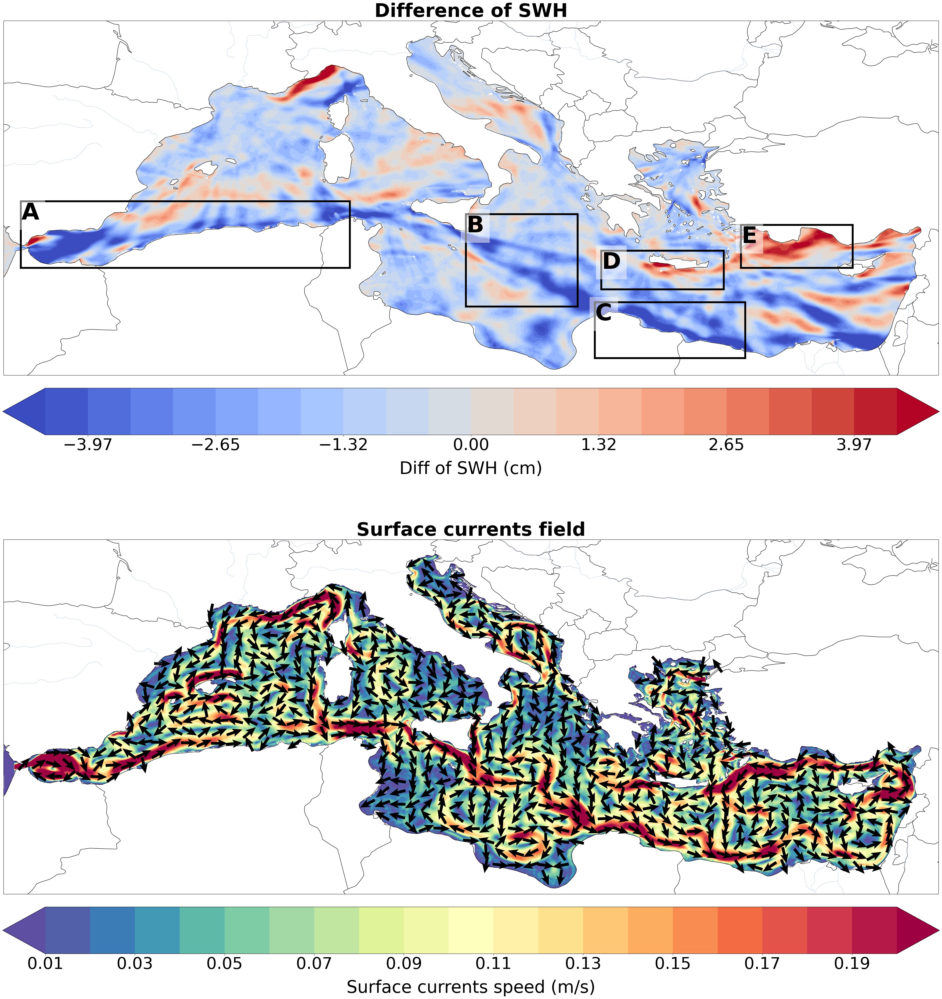

In [43]:
from matplotlib.patches import Rectangle
from matplotlib.colors import TwoSlopeNorm

List_seasons = ["Yearly", "JFM", "AMJ", "JAS", "OND"]

List_parameters = [hs_no_cur, 100*diff_hs2d, cur_speed]

List_var = ["SWH (m)", "SWH (cm)", "currents speed (m/s)"]
List_colorbar = ["Spectral_r", "coolwarm", "Spectral_r"]

List_format_var = [2,2,3]
List_format_diff = [2,3,2]
format_bounds = [2]


for j in range(0,1):
    fig, axes = plt.subplots(2, 1, figsize=(50, 46), 
    subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.flatten()  # flatten to a 1D array of length 10
    ax1, ax2 = axes

    # fig.suptitle(f'Wave field', x=0.45,y=0.67, 
    #           ha='center',fontsize = 26)
    #plt.rcParams.update({"axes.titlesize": 24,"axes.labelsize": 24})
    #plt.subplots_adjust(hspace=0.15, wspace=0.05)  # increase vertical & horizontal spacing
    #plt.subplots_adjust(hspace=0.15)
    CBAR_SHRINK = 0.9

    step = 21
    
    bounds_diff_hs,_ = adaptive_percentile_range(diff_hs2d[j])
    min_diff_hs, max_diff_hs = 100*bounds_diff_hs
    # symmetric range
    abs_max = max(abs(min_diff_hs), abs(max_diff_hs))

    # choose normalization automatically
    if min_diff_hs < 0 and max_diff_hs > 0:
        # mixed values → use diverging normalization centered at 0
        norm_2 = TwoSlopeNorm(vmin=-abs_max, vcenter=0, vmax=abs_max)
    else:
        # only positive or only negative → use standard normalization
        norm_2 = mcolors.Normalize(vmin=min_diff_hs, vmax=max_diff_hs)
    levels_2 = np.round(np.linspace(-abs_max, abs_max, step), 
                        format_bounds[0])
    levels_2 = np.unique(levels_2)
    cf = ax1.contourf(ds_0_sel.longitude,ds_0_sel.latitude,100*diff_hs2d[j], 
                    transform=ccrs.PlateCarree(), 
                    levels=levels_2,
                    norm=norm_2, extend = "both",cmap="coolwarm")
    cbar = fig.colorbar(cf,pad=0.03,ax =ax1,label="Diff of SWH (cm)",
                        shrink=CBAR_SHRINK, orientation='horizontal')
    cbar.set_label(label="Diff of SWH (cm)", size=46, labelpad=20)
    style_axis(ax1, title="Difference of SWH", cbar=cbar, cbar_tick_fontsize=44)


    #bounds_wnd_speed,_ = adaptive_percentile_range(c_group_no_cur[j])
    """bounds_wnd_speed,_ = adaptive_percentile_range(diff_hs2d)
    min_wnd_speed, max_wnd_speed = bounds_wnd_speed
    # Define normalization
    norm_1 = mcolors.Normalize(vmin=min_wnd_speed, vmax=max_wnd_speed)
    levels_1 = np.round(np.linspace(min_wnd_speed, max_wnd_speed, step), 
                        2)
    levels_1 = np.unique(levels_1)
    cf = ax1.contourf(ds_0_sel.longitude, ds_0_sel.latitude, diff_hs2d[j],
                    transform=ccrs.PlateCarree(),
                    levels=levels_1,
                    norm=norm_1, extend="both", cmap="Spectral_r")
    #cbar = fig.colorbar(cf, pad=0.03, ax=ax1, label="Wave group speed (m/s)",
    #shrink=CBAR_SHRINK, orientation='horizontal')
    cbar = fig.colorbar(cf, pad=0.03, ax=ax1, label="Diff of SWH (cm)",
    shrink=CBAR_SHRINK, orientation='horizontal')
    #cbar.set_label(label="Wave group speed (m/s)", size=46, labelpad=20)
    cbar.set_label(label="Diff of SWH (cm)", size=46, labelpad=20)"""

    """step_norm = 22
    U_norm_group_with_cur = c_group_no_cur[j, ::step_norm, ::step_norm]
    U_group_with_cur = u_group_no_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
    V_group_with_cur = v_group_no_cur[j, ::step_norm, ::step_norm] / U_norm_group_with_cur
    X, Y = lon2d[::step_norm, ::step_norm], lat2d[::step_norm, ::step_norm]

    ax1.quiver(X, Y, U_group_with_cur, V_group_with_cur, transform=ccrs.PlateCarree(),pivot = 'mid',  
                scale_units='xy', scale=1.5, angles='xy', width = 0.0025,
                headlength = 3.5, headaxislength = 3.0)"""
    #style_axis(ax1, "Waves field", cbar=cbar, cbar_tick_fontsize=44)
    #style_axis(ax1, "Difference of SWH", cbar=cbar, cbar_tick_fontsize=44)

    bounds_cur_speed,_ = adaptive_percentile_range(cur_speed[j])
    min_cur_speed, max_cur_speed = bounds_cur_speed
    # Define normalization
    norm_2 = mcolors.Normalize(vmin=min_cur_speed, vmax=max_cur_speed)
    levels_2 = np.round(np.linspace(min_cur_speed, max_cur_speed, step), 
                        2)
    levels_2 = np.unique(levels_2)
    cf = ax2.contourf(ds_0_sel.longitude, ds_0_sel.latitude, cur_speed[j],
                    transform=ccrs.PlateCarree(),
                    levels=levels_2,
                    norm=norm_2, extend="both", cmap="Spectral_r")
    cbar = fig.colorbar(cf, pad=0.03, ax=ax2, label="Surface currents speed (m/s)",
    shrink=CBAR_SHRINK, orientation='horizontal')
    cbar.set_label(label="Surface currents speed (m/s)", size=46, labelpad=20)

    step_norm = 25
    U_norm_cur = np.sqrt(ds_3_sel["ucur"][j,::step_norm,::step_norm]**2 + ds_3_sel["vcur"][j,::step_norm,::step_norm]**2)
    U_cur = ds_3_sel["ucur"][j, ::step_norm, ::step_norm] / U_norm_cur
    V_cur = ds_3_sel["vcur"][j, ::step_norm, ::step_norm] / U_norm_cur
    X = ds_0_sel.longitude[::step_norm,::step_norm]
    Y = ds_0_sel.latitude[::step_norm,::step_norm]

    ax2.quiver(X, Y, U_cur, V_cur, transform=ccrs.PlateCarree(), pivot='mid', 
               width = 0.003,
                scale_units='xy', scale=1.3, angles='xy', headlength = 3.5,
                headaxislength = 3)
    style_axis(ax2, "Surface currents field", cbar=cbar, cbar_tick_fontsize=44)

    """labels = ["A", "B", "C", "D", "E"]

    if j == 0: 

        lon_min = [-5.7, 15, 21, 21.3, 27.8]
        lon_max = [9.6, 20.2, 28, 27, 33]
        lat_min = [35, 33.2, 30.8, 34, 35]
        lat_max = [38.1, 37.5, 33.4, 35.8, 37]

    for ax in (ax1,ax2):
        roi_box_1 = Rectangle(
            (lon_min[0], lat_min[0]), lon_max[0] - lon_min[0], lat_max[0] - lat_min[0],
            linewidth=4, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
        roi_box_2 = Rectangle(
            (lon_min[1], lat_min[1]), lon_max[1] - lon_min[1], lat_max[1] - lat_min[1],
            linewidth=5, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
        roi_box_3 = Rectangle(
            (lon_min[2], lat_min[2]), lon_max[2] - lon_min[2], lat_max[2] - lat_min[2],
            linewidth=4, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
        roi_box_4 = Rectangle(
            (lon_min[3], lat_min[3]), lon_max[3] - lon_min[3], lat_max[3] - lat_min[3],
            linewidth=4, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
        roi_box_5 = Rectangle(
            (lon_min[4], lat_min[4]), lon_max[4] - lon_min[4], lat_max[4] - lat_min[4],
            linewidth=4, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
        
        ax.add_patch(roi_box_1)
        box_text(ax,labels=labels[0],lon_min=lon_min[0],lat_max=lat_max[0])
        ax.add_patch(roi_box_2)
        box_text(ax,labels=labels[1],lon_min=lon_min[1],lat_max=lat_max[1])
        ax.add_patch(roi_box_3)
        box_text(ax,labels=labels[2],lon_min=lon_min[2],lat_max=lat_max[2])
        ax.add_patch(roi_box_4)
        box_text(ax,labels=labels[3],lon_min=lon_min[3],lat_max=lat_max[3])
        ax.add_patch(roi_box_5)
        box_text(ax,labels=labels[4],lon_min=lon_min[4],lat_max=lat_max[4])"""
    
    labels = ["A", "B", "C", "D", "E"]

    if j == 0: 

        lon_min = [-5.7, 15, 21, 21.3, 27.8]
        lon_max = [9.6, 20.2, 28, 27, 33]
        lat_min = [35, 33.2, 30.8, 34, 35]
        lat_max = [38.1, 37.5, 33.4, 35.8, 37]

ax=ax1
roi_box_1 = Rectangle(
    (lon_min[0], lat_min[0]), lon_max[0] - lon_min[0], lat_max[0] - lat_min[0],
    linewidth=5, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
roi_box_2 = Rectangle(
    (lon_min[1], lat_min[1]), lon_max[1] - lon_min[1], lat_max[1] - lat_min[1],
    linewidth=5, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
roi_box_3 = Rectangle(
    (lon_min[2], lat_min[2]), lon_max[2] - lon_min[2], lat_max[2] - lat_min[2],
    linewidth=5, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
roi_box_4 = Rectangle(
    (lon_min[3], lat_min[3]), lon_max[3] - lon_min[3], lat_max[3] - lat_min[3],
    linewidth=5, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)
roi_box_5 = Rectangle(
    (lon_min[4], lat_min[4]), lon_max[4] - lon_min[4], lat_max[4] - lat_min[4],
    linewidth=5, edgecolor='black', facecolor='none', transform=ccrs.PlateCarree(), zorder=10)

ax.add_patch(roi_box_1)
box_text(ax,labels=labels[0],lon_min=lon_min[0],lat_max=lat_max[0])
ax.add_patch(roi_box_2)
box_text(ax,labels=labels[1],lon_min=lon_min[1],lat_max=lat_max[1])
ax.add_patch(roi_box_3)
box_text(ax,labels=labels[2],lon_min=lon_min[2],lat_max=lat_max[2])
ax.add_patch(roi_box_4)
box_text(ax,labels=labels[3],lon_min=lon_min[3],lat_max=lat_max[3])
ax.add_patch(roi_box_5)
box_text(ax,labels=labels[4],lon_min=lon_min[4],lat_max=lat_max[4])